<a href="https://colab.research.google.com/github/TeenaJaglan/Streamlit---Indian-Census/blob/main/eda_smartphone.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# EDA-smartphone Dataset

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import re

  #SUMMARY
  - camera, card, os , rating is empty
  - dtype issue of price
  - battery - capacity + new col needs to be formed having fast charging or not
  - card, os- messy : if not supported - make it 0 else by how much TB as unit
  - ram - total will be summed up  and contain data of battery and processor feilds so correct it - messy
  - display needs to be categorized

In [ ]:
df = pd.read_csv("/content/sample_data/smartphones - smartphones.csv")
df.head(5)

,model,price,rating,sim,processor,ram,battery,display,camera,card,os
0,OnePlus 11 5G,"₹54,999",89.0,"Dual Sim, 3G, 4G, 5G, VoLTE, Wi-Fi, NFC","Snapdragon 8 Gen2, Octa Core, 3.2 GHz Processor","12 GB RAM, 256 GB inbuilt",5000 mAh Battery with 100W Fast Charging,"6.7 inches, 1440 x 3216 px, 120 Hz Display wit...",50 MP + 48 MP + 32 MP Triple Rear & 16 MP Fron...,Memory Card Not Supported,Android v13
1,OnePlus Nord CE 2 Lite 5G,"₹19,989",81.0,"Dual Sim, 3G, 4G, 5G, VoLTE, Wi-Fi","Snapdragon 695, Octa Core, 2.2 GHz Processor","6 GB RAM, 128 GB inbuilt",5000 mAh Battery with 33W Fast Charging,"6.59 inches, 1080 x 2412 px, 120 Hz Display wi...",64 MP + 2 MP + 2 MP Triple Rear & 16 MP Front ...,"Memory Card (Hybrid), upto 1 TB",Android v12
2,Samsung Galaxy A14 5G,"₹16,499",75.0,"Dual Sim, 3G, 4G, 5G, VoLTE, Wi-Fi","Exynos 1330, Octa Core, 2.4 GHz Processor","4 GB RAM, 64 GB inbuilt",5000 mAh Battery with 15W Fast Charging,"6.6 inches, 1080 x 2408 px, 90 Hz Display with...",50 MP + 2 MP + 2 MP Triple Rear & 13 MP Front ...,"Memory Card Supported, upto 1 TB",Android v13
3,Motorola Moto G62 5G,"₹14,999",81.0,"Dual Sim, 3G, 4G, 5G, VoLTE, Wi-Fi","Snapdragon 695, Octa Core, 2.2 GHz Processor","6 GB RAM, 128 GB inbuilt",5000 mAh Battery with Fast Charging,"6.55 inches, 1080 x 2400 px, 120 Hz Display wi...",50 MP + 8 MP + 2 MP Triple Rear & 16 MP Front ...,"Memory Card (Hybrid), upto 1 TB",Android v12
4,Realme 10 Pro Plus,"₹24,999",82.0,"Dual Sim, 3G, 4G, 5G, VoLTE, Wi-Fi","Dimensity 1080, Octa Core, 2.6 GHz Processor","6 GB RAM, 128 GB inbuilt",5000 mAh Battery with 67W Fast Charging,"6.7 inches, 1080 x 2412 px, 120 Hz Display wit...",108 MP + 8 MP + 2 MP Triple Rear & 16 MP Front...,Memory Card Not Supported,Android v13


In [ ]:
dt = df.copy()

#**SIM** **and RATING**

In [ ]:
df['rating'].plot(kind='hist')
# all values lie between 60-90 and taing is out of 100 most probably

TypeError: no numeric data to plot

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1020 entries, 0 to 1019
Data columns (total 11 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   model      1020 non-null   object
 1   price      1020 non-null   int64 
 2   rating     1020 non-null   object
 3   sim        1020 non-null   object
 4   processor  1020 non-null   object
 5   ram        1020 non-null   object
 6   battery    1020 non-null   object
 7   display    1020 non-null   object
 8   camera     1019 non-null   object
 9   card       1013 non-null   object
 10  os         1003 non-null   object
dtypes: int64(1), object(10)
memory usage: 87.8+ KB


In [ ]:
df['price']

,price
0,54999
1,19989
2,16499
3,14999
4,24999
...,...
1015,34990
1016,14990
1017,28990
1018,19990


In [ ]:
def change(x):

  p = re.findall('\d',x)
  z =  "".join(p)
  return int(z)

df['price'] = df['price'].apply(lambda x:change(x))
# df[ not df['price']]
# df['price']

<>:3: SyntaxWarning: invalid escape sequence '\d'
<>:3: SyntaxWarning: invalid escape sequence '\d'
/tmp/ipykernel_3303/829291769.py:3: SyntaxWarning: invalid escape sequence '\d'
  p = re.findall('\d',x)


TypeError: expected string or bytes-like object, got 'int'

In [ ]:
df['price'].isnull().sum()

np.int64(0)

<Axes: xlabel='price', ylabel='Density'>

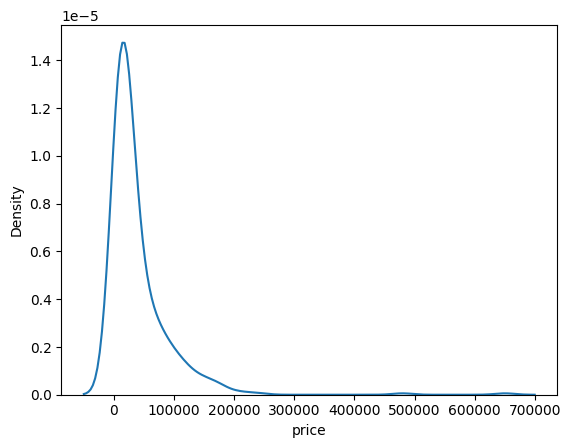

In [ ]:
z = df['price'].value_counts().reset_index()
sns.kdeplot(z,x='price')



In [ ]:
df['battery'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 1020 entries, 0 to 1019
Series name: battery
Non-Null Count  Dtype 
--------------  ----- 
1020 non-null   object
dtypes: object(1)
memory usage: 8.1+ KB


In [ ]:
df['battery']
battery = list()
charging_type = list()
charging_value = list()

def total(x):
  p = re.findall('\d+\.\d',x)
  z = re.findall('\d+',x)
  # print(p,z)
  if len(z)>0:
    battery.append(int(z[0]))
  if len(z)==2:
    charging_type.append(float(z[1]))
  elif len(p)>0:
    charging_type.append(float(p[0]))
  if 'Fast Charging' in x:
    charging_type.append(1)
  else:
    charging_value.append(0)



# total('5000 mAh Battery with 10.5W Fast Charging')
df['battery'].apply(lambda x :total(x))
dt = df.copy()
dt.drop(columns=['battery'])
# dt['battery value'] = battery
# dt['charging type'] = charging_type
# dt['charging value'] = charging_value
# dt
print(len(battery),len(charging_type),len(charging_value))

1019 1637 183


<>:7: SyntaxWarning: invalid escape sequence '\d'
<>:8: SyntaxWarning: invalid escape sequence '\d'
<>:7: SyntaxWarning: invalid escape sequence '\d'
<>:8: SyntaxWarning: invalid escape sequence '\d'
/tmp/ipykernel_3303/1666609834.py:7: SyntaxWarning: invalid escape sequence '\d'
  p = re.findall('\d+\.\d',x)
/tmp/ipykernel_3303/1666609834.py:8: SyntaxWarning: invalid escape sequence '\d'
  z = re.findall('\d+',x)


In [ ]:
df['rating']

,rating
0,Excellent
1,good
2,poor
3,good
4,good
...,...
1015,good
1016,poor
1017,good
1018,good


In [ ]:

for i in range(0,len(df['rating'])):
  if df['rating'][i]<=75:
    df['rating'][i] = 'poor'
  elif df['rating'][i]<=85:
    df['rating'][i] = 'good'
  elif df['rating'][i]<=95:
    df['rating'][i] = 'Excellent'
  else:
    df['rating'][i]= 'Outstanding'
df['rating']


TypeError: '<=' not supported between instances of 'str' and 'int'

In [ ]:
df.groupby(by=['rating'])['price'].agg(func=['mean','median','count'])

,mean,median,count
rating,,,
Excellent,55494.411348,45999.0,141
Outstanding,41712.184397,8199.0,141
good,29405.857143,21899.0,455
poor,17361.865724,11700.0,283


In [ ]:
def colorfunc(x):
  color = ""
  if x<20000 and x>1000:
    color = 'blue'
    return 'color: blue'
  elif x>50000:
    color = 'red'
    return 'color: red'

colorfunc(23000)
df.groupby(by= 'rating')['price'].agg(
   func = ['mean','median','count']
).style.map(lambda x:colorfunc(x))

#excellent rating phones are costlier wehereas cheap ones are small
# but there exists a quality one whose rating is also outstanding price is also less.

,mean,median,count
rating,,,
Excellent,55494.411348,45999.000000,141
Outstanding,41712.184397,8199.000000,141
good,29405.857143,21899.000000,455
poor,17361.865724,11700.000000,283


In [ ]:
def func(x):
  c = 0;
  if 'Dual Sim' in x:
    c+=1
  elif 'Single Sim' in x :
    c+=0.75
  if 'VoLTE' in x:
    c+=1
  if 'NFC' in x:
    c+=1
  if 'Wi-Fi' in x:
    c+=1
  if '5G' in x:
    c+=1
  elif '4G' in x:
    c+=0.5
  elif '3G' in x:
    c+=0.25
  if 'IR Blaster' in x :
    c+=10 # indicating it has new technology
  return c;


In [ ]:

k = dt['sim'].value_counts().reset_index()
k['sim count'] = k['sim'].apply(lambda x:func(x))
k


,sim,count,sim count
0,"Dual Sim, 3G, 4G, VoLTE, Wi-Fi",324,3.50
1,"Dual Sim, 3G, 4G, 5G, VoLTE, Wi-Fi, NFC",268,5.00
2,"Dual Sim, 3G, 4G, 5G, VoLTE, Wi-Fi",155,4.00
3,"Dual Sim, 3G, 4G, 5G, VoLTE, Wi-Fi, IR Blaster",54,14.00
4,"Dual Sim, 3G, 4G, 5G, VoLTE, Wi-Fi, NFC, IR Bl...",52,15.00
5,"Dual Sim, 3G, 4G, VoLTE, Wi-Fi, NFC",46,4.50
6,"Dual Sim, 3G, 4G, VoLTE, Wi-Fi, IR Blaster",46,13.50
7,Dual Sim,13,1.00
8,"Dual Sim, 3G, 4G, Wi-Fi",9,2.50
9,"Dual Sim, 3G, 4G, 5G, VoLTE, Vo5G, Wi-Fi, NFC",7,5.00


#SIM


In [ ]:
# dual sim - gives qualtiy
# 5g volte - good net and quality
# wifi options
# nfc - bluettoth types
# let us break it into points
#dividing sim into categories - 6 1 for each point

In [ ]:
df['sim'].value_counts()

,count
sim,
3.50,327
5.00,275
4.00,158
14.00,55
15.00,53
4.50,46
13.50,46
2.50,14
1.00,14


In [ ]:
z = df.groupby(by='sim')[['price']]\
.agg(func=['count','mean','median','sum','min','max'])
# single sim cost - around 2000 and minimum 1300 max to max 3000
# dual sim , wifi - around 1469 , min - 599 and max - 18900 differes maybe because of processor
# dual sim , 3g , 4g has this following data

z

price                                                 
      count           mean   median       sum    min     max
sim                                                         
0.75      4    1908.250000   1767.5      7633   1299    2799
1.00     14    2759.428571   1469.0     38632    599   18900
1.50      3    4399.000000   4649.0     13197   3749    4799
2.00      1    1799.000000   1799.0      1799   1799    1799
2.25      3    6365.666667   6999.0     19097     99   11999
2.50     14    6399.357143   4888.5     89591   1762   29990
3.25      4  213247.000000  93994.5    852988  14999  650000
3.50    327   12291.908257  11700.0   4019454   1999   29999
3.75      1   34999.000000  34999.0     34999  34999   34999
4.00    158   26234.272152  21990.0   4145015   8990  199990
4.25      4   19492.250000  15994.5     77969  15990   29990
4.50     46   42924.500000  23499.0   1974527  10999  480000
4.75      7   61708.142857  69999.0    431957  30990   89990
5.00    275   55808.167273  43900.0  15347246   8990  182999
13.50    46   13875.456522  13249.0    638271   9990   19999
14.00    55   20479.363636  18499.0   1126365  10990   33749
14.50     5  109795.400000  69990.0    548977  14999  239999
15.00    53   49650.679245  39999.0   2631486  16999  214990

In [ ]:
k = dt['sim'].value_counts().reset_index()
k = pd.DataFrame(k)
k = k.rename(columns = {'sim':'sim name'})
k['sim'] = k['sim name'].apply(lambda x:func(x))
a1 = pd.DataFrame(k)
a1
k

,sim name,count,sim
0,"Dual Sim, 3G, 4G, VoLTE, Wi-Fi",324,3.50
1,"Dual Sim, 3G, 4G, 5G, VoLTE, Wi-Fi, NFC",268,5.00
2,"Dual Sim, 3G, 4G, 5G, VoLTE, Wi-Fi",155,4.00
3,"Dual Sim, 3G, 4G, 5G, VoLTE, Wi-Fi, IR Blaster",54,14.00
4,"Dual Sim, 3G, 4G, 5G, VoLTE, Wi-Fi, NFC, IR Bl...",52,15.00
5,"Dual Sim, 3G, 4G, VoLTE, Wi-Fi, NFC",46,4.50
6,"Dual Sim, 3G, 4G, VoLTE, Wi-Fi, IR Blaster",46,13.50
7,Dual Sim,13,1.00
8,"Dual Sim, 3G, 4G, Wi-Fi",9,2.50
9,"Dual Sim, 3G, 4G, 5G, VoLTE, Vo5G, Wi-Fi, NFC",7,5.00


In [ ]:
a2 = pd.DataFrame(z)
a2.columns = a2.columns.get_level_values(1)
a2.reset_index()

,sim,count,mean,median,sum,min,max
0,0.75,4,1908.250000,1767.5,7633,1299,2799
1,1.00,14,2759.428571,1469.0,38632,599,18900
2,1.50,3,4399.000000,4649.0,13197,3749,4799
3,2.00,1,1799.000000,1799.0,1799,1799,1799
4,2.25,3,6365.666667,6999.0,19097,99,11999
5,2.50,14,6399.357143,4888.5,89591,1762,29990
6,3.25,4,213247.000000,93994.5,852988,14999,650000
7,3.50,327,12291.908257,11700.0,4019454,1999,29999
8,3.75,1,34999.000000,34999.0,34999,34999,34999
9,4.00,158,26234.272152,21990.0,4145015,8990,199990


In [ ]:


result = pd.merge(a2, a1, on='sim', how='inner')
result.drop(columns=['count_x'],inplace=True)
result
# result.drop(columns=['index'],inplace=True)
# this is a very good table to find the prices as per sim

,sim,mean,median,sum,min,max,sim name,count_y
0,0.75,1908.250000,1767.5,7633,1299,2799,Single Sim,4
1,1.00,2759.428571,1469.0,38632,599,18900,Dual Sim,13
2,1.00,2759.428571,1469.0,38632,599,18900,Wi-Fi,1
3,1.50,4399.000000,4649.0,13197,3749,4799,"Dual Sim, 3G, 4G",3
4,2.00,1799.000000,1799.0,1799,1799,1799,"Dual Sim, Wi-Fi",1
5,2.25,6365.666667,6999.0,19097,99,11999,"Dual Sim, 3G, Wi-Fi",2
6,2.25,6365.666667,6999.0,19097,99,11999,"Single Sim, 3G, 4G, Wi-Fi",1
7,2.50,6399.357143,4888.5,89591,1762,29990,"Dual Sim, 3G, 4G, Wi-Fi",9
8,2.50,6399.357143,4888.5,89591,1762,29990,"Dual Sim, 3G, 4G, VoLTE",5
9,3.25,213247.000000,93994.5,852988,14999,650000,"Single Sim, 3G, 4G, VoLTE, Wi-Fi",3


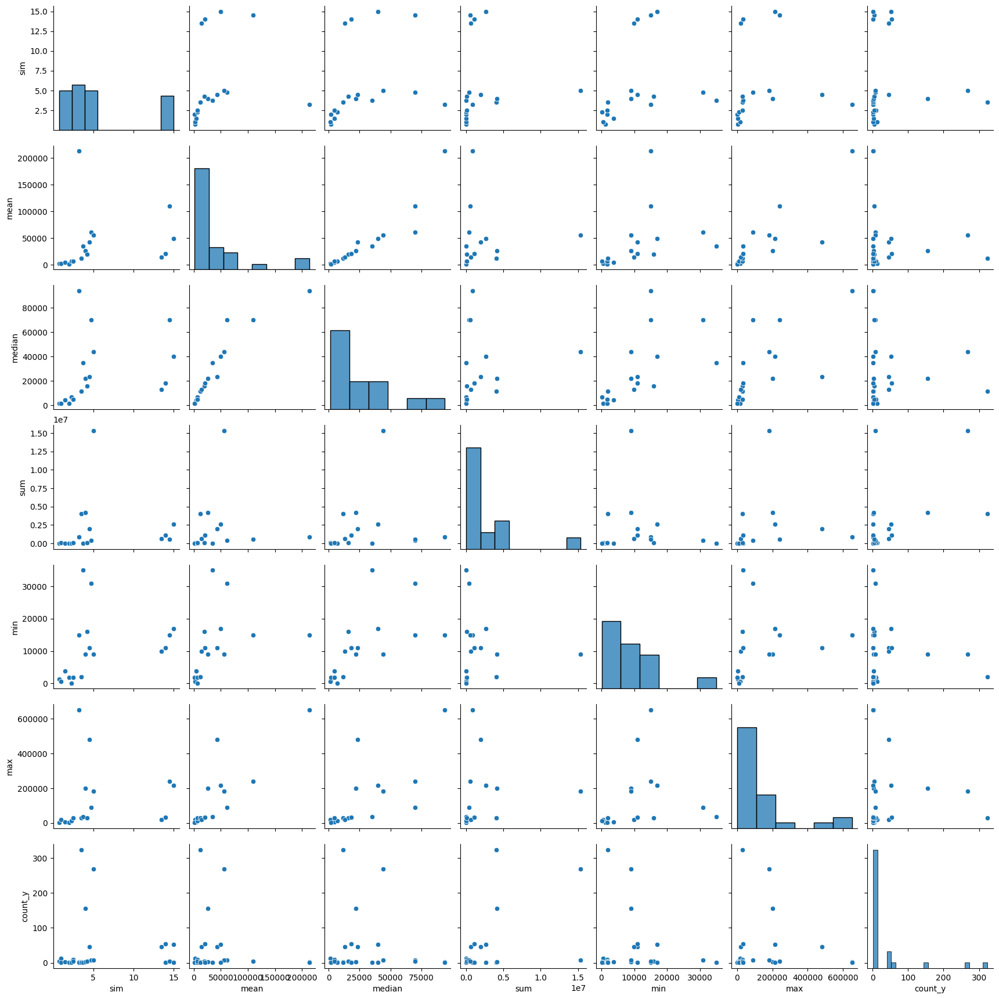

In [ ]:
sns.pairplot(result)

#RAM AND CARD

In [ ]:
df['ram'].value_counts()

,count
ram,
"8 GB RAM, 128 GB inbuilt",267
"6 GB RAM, 128 GB inbuilt",190
"4 GB RAM, 64 GB inbuilt",143
"12 GB RAM, 256 GB inbuilt",70
"8 GB RAM, 256 GB inbuilt",70
"4 GB RAM, 128 GB inbuilt",62
"3 GB RAM, 32 GB inbuilt",37
"6 GB RAM, 64 GB inbuilt",29
"2 GB RAM, 32 GB inbuilt",24


In [ ]:
df['ram'].value_counts()

,count
ram,
"8 GB RAM, 128 GB inbuilt",267
"6 GB RAM, 128 GB inbuilt",190
"4 GB RAM, 64 GB inbuilt",143
"12 GB RAM, 256 GB inbuilt",70
"8 GB RAM, 256 GB inbuilt",70
"4 GB RAM, 128 GB inbuilt",62
"3 GB RAM, 32 GB inbuilt",37
"6 GB RAM, 64 GB inbuilt",29
"2 GB RAM, 32 GB inbuilt",24


In [ ]:
x = "8 MB RAM, 16 MB inbuilt"
def func_units(x):
  #unit of one
  ls = list()
  p = re.findall('\D+',x)
  t = p[0].split(" ")
  # print(p)
  # print(t)
  ls.append(t[0][1:])
  if len(p)>1:
    t = p[1].split(" ")
    ls.append(t[0][1:])
  # print(ls)
  for i in range(0,len(ls)):
    if ls[i] == 'MB':
      ls[i] = 0.001
    elif ls[i] =='GB':
      ls[i] = 1
    elif ls[i]=='TB':
      ls[i] = 1000
  # print(ls)
  return ls;
func_units(x)

<>:5: SyntaxWarning: invalid escape sequence '\D'
<>:5: SyntaxWarning: invalid escape sequence '\D'
/tmp/ipykernel_3303/2741120194.py:5: SyntaxWarning: invalid escape sequence '\D'
  p = re.findall('\D+',x)


[0.001, 0.001]

In [ ]:

df['ram']
def total_function(x,i):
  i = int(i)
  x = str(x)
  total = 0
  if 'Battery' in x:
    pp = str(df.loc[i, 'battery'])
    df.loc[i, 'battery'] = pp + x
    total = 2
  elif 'display' in x:
    pp = str(df.loc[i, 'display'] )
    df.loc[i, 'display'] = pp + x
    total = 2
  elif 'Processor' in x:
    pp = str(df.loc[i,'processor'] )
    df.loc[i,'processor'] = pp + x +""
    total = 2
  if 'RAM' in x or 'inbuilt' in x:
    values = re.findall('\d+',x)
    ls = list()
    ls = func_units(x)
    if len(ls)>0 :
      total+=float(values[0])*ls[0]
    if len(ls)>1 :
      total+=float(values[1])*ls[1]
      # print(total)
  return total

df['total ram'] = df['ram'].reset_index().apply(lambda x:total_function(x['ram'],x['index']),axis=1)

df['total ram']

<>:19: SyntaxWarning: invalid escape sequence '\d'
<>:19: SyntaxWarning: invalid escape sequence '\d'
/tmp/ipykernel_3303/4211649687.py:19: SyntaxWarning: invalid escape sequence '\d'
  values = re.findall('\d+',x)


,total ram
0,268.0
1,134.0
2,68.0
3,134.0
4,134.0
...,...
1015,136.0
1016,134.0
1017,264.0
1018,134.0


In [ ]:
type(df['processor'][20]),type(df.loc[0,'processor'])
print(type(df['battery'][i]))

<class 'str'>


<Axes: xlabel='price', ylabel='total ram'>

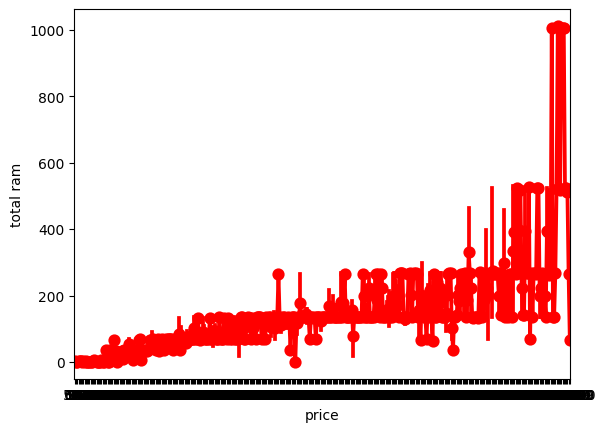

In [ ]:
sns.pointplot(y='total ram',x='price',data=df,color='red')

#highest price has highest ram

<Axes: xlabel='rating', ylabel='total ram'>

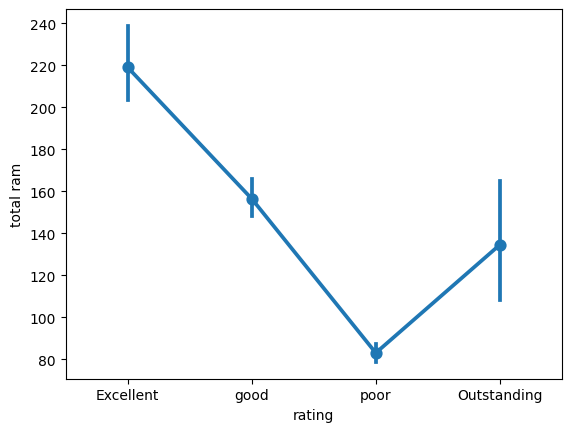

In [ ]:
sns.pointplot(y='total ram',x='rating',data=df)
# jo poor rating - low ram , excellent has maximum ram , then good

<Axes: xlabel='rating', ylabel='price'>

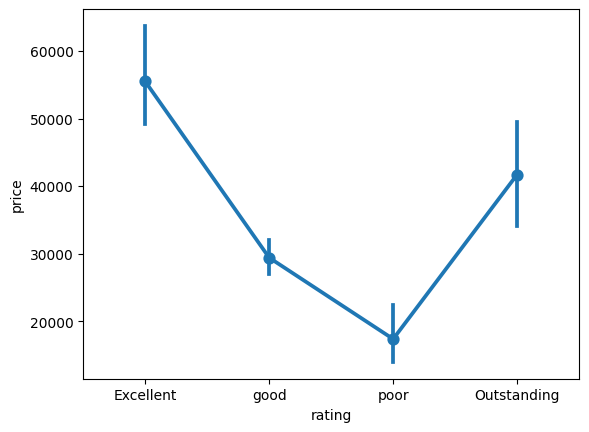

In [ ]:
sns.pointplot(y='price',x='rating',data=df)
#excellent ka price sabse zyada , poor ka sabse kaam even though outstanding ke reviews zyada h but price kaam h

In [ ]:
df = df.drop(columns = ["ram"])
df

,model,price,rating,sim,processor,battery,display,camera,card,os,total ram
0,OnePlus 11 5G,54999,Excellent,5.0,"Snapdragon 8 Gen2, Octa Core, 3.2 GHz Processor",5000 mAh Battery with 100W Fast Charging,"6.7 inches, 1440 x 3216 px, 120 Hz Display wit...",50 MP + 48 MP + 32 MP Triple Rear & 16 MP Fron...,Memory Card Not Supported,Android v13,268.0
1,OnePlus Nord CE 2 Lite 5G,19989,good,4.0,"Snapdragon 695, Octa Core, 2.2 GHz Processor",5000 mAh Battery with 33W Fast Charging,"6.59 inches, 1080 x 2412 px, 120 Hz Display wi...",64 MP + 2 MP + 2 MP Triple Rear & 16 MP Front ...,"Memory Card (Hybrid), upto 1 TB",Android v12,134.0
2,Samsung Galaxy A14 5G,16499,poor,4.0,"Exynos 1330, Octa Core, 2.4 GHz Processor",5000 mAh Battery with 15W Fast Charging,"6.6 inches, 1080 x 2408 px, 90 Hz Display with...",50 MP + 2 MP + 2 MP Triple Rear & 13 MP Front ...,"Memory Card Supported, upto 1 TB",Android v13,68.0
3,Motorola Moto G62 5G,14999,good,4.0,"Snapdragon 695, Octa Core, 2.2 GHz Processor",5000 mAh Battery with Fast Charging,"6.55 inches, 1080 x 2400 px, 120 Hz Display wi...",50 MP + 8 MP + 2 MP Triple Rear & 16 MP Front ...,"Memory Card (Hybrid), upto 1 TB",Android v12,134.0
4,Realme 10 Pro Plus,24999,good,4.0,"Dimensity 1080, Octa Core, 2.6 GHz Processor",5000 mAh Battery with 67W Fast Charging,"6.7 inches, 1080 x 2412 px, 120 Hz Display wit...",108 MP + 8 MP + 2 MP Triple Rear & 16 MP Front...,Memory Card Not Supported,Android v13,134.0
...,...,...,...,...,...,...,...,...,...,...,...
1015,Motorola Moto Edge S30 Pro,34990,good,4.0,"Snapdragon 8 Gen1, Octa Core, 3 GHz Processor",5000 mAh Battery with 68.2W Fast Charging,"6.67 inches, 1080 x 2460 px, 120 Hz Display wi...",64 MP + 8 MP + 2 MP Triple Rear & 16 MP Front ...,Android v12,No FM Radio,136.0
1016,Honor X8 5G,14990,poor,4.0,"Snapdragon 480+, Octa Core, 2.2 GHz Processor",5000 mAh Battery with 22.5W Fast Charging,"6.5 inches, 720 x 1600 px Display with Water D...",48 MP + 2 MP + Depth Sensor Triple Rear & 8 MP...,"Memory Card Supported, upto 1 TB",Android v11,134.0
1017,POCO X4 GT 5G (8GB RAM + 256GB),28990,good,15.0,"Dimensity 8100, Octa Core, 2.85 GHz Processor",5080 mAh Battery with 67W Fast Charging,"6.6 inches, 1080 x 2460 px, 144 Hz Display wit...",64 MP + 8 MP + 2 MP Triple Rear & 16 MP Front ...,Memory Card Not Supported,Android v12,264.0
1018,Motorola Moto G91 5G,19990,good,5.0,"Snapdragon 695, Octa Core, 2.2 GHz Processor",5000 mAh Battery with Fast Charging,"6.8 inches, 1080 x 2400 px Display with Punch ...",108 MP + 8 MP + 2 MP Triple Rear & 32 MP Front...,"Memory Card Supported, upto 1 TB",Android v12,134.0


# MEMORY CARD AND OS

In [ ]:
df['os'].value_counts()

,count
os,
Android v12,287
Android v11,233
No FM Radio,192
Android v10,58
Android v13,45
Bluetooth,38
Android v9.0 (Pie),27
Android v10.0,22
iOS v16,14


In [ ]:
def new_fun(x,i):
  i = int(i)
  x = str(x)
  if  'Memory Card'  in x  or 'Rear Camera' in x :
    pp = str(df.loc[i,'card'])
    df.loc[i,'card'] = pp + x
    if "Iphone" in str(df.loc[i,'model']):
      return 'iOS'
    else:
      return 'Android'
  elif x=='nan':
    if "Iphone" in str(df.loc[i,'model']):
      return 'iOS'
    else:
      return 'Android'
  else:
    return x


df['os'] = df['os'].reset_index().apply(lambda x: new_fun(x['os'],x['index']),axis=1)


In [ ]:
d = pd.crosstab(df['os'],df['rating']).reset_index()
d

rating,os,Excellent,Outstanding,good,poor
0,Android,7,31,2,1
1,Android v10,7,9,16,26
2,Android v10.0,4,2,10,6
3,Android v11,17,9,116,91
4,Android v11.0,0,1,0,3
5,Android v12,27,23,139,98
6,Android v12.1,0,1,0,0
7,Android v13,6,3,28,8
8,Android v4.4.2 (KitKat),0,0,0,1
9,Android v5.1 (Lollipop),0,1,0,0


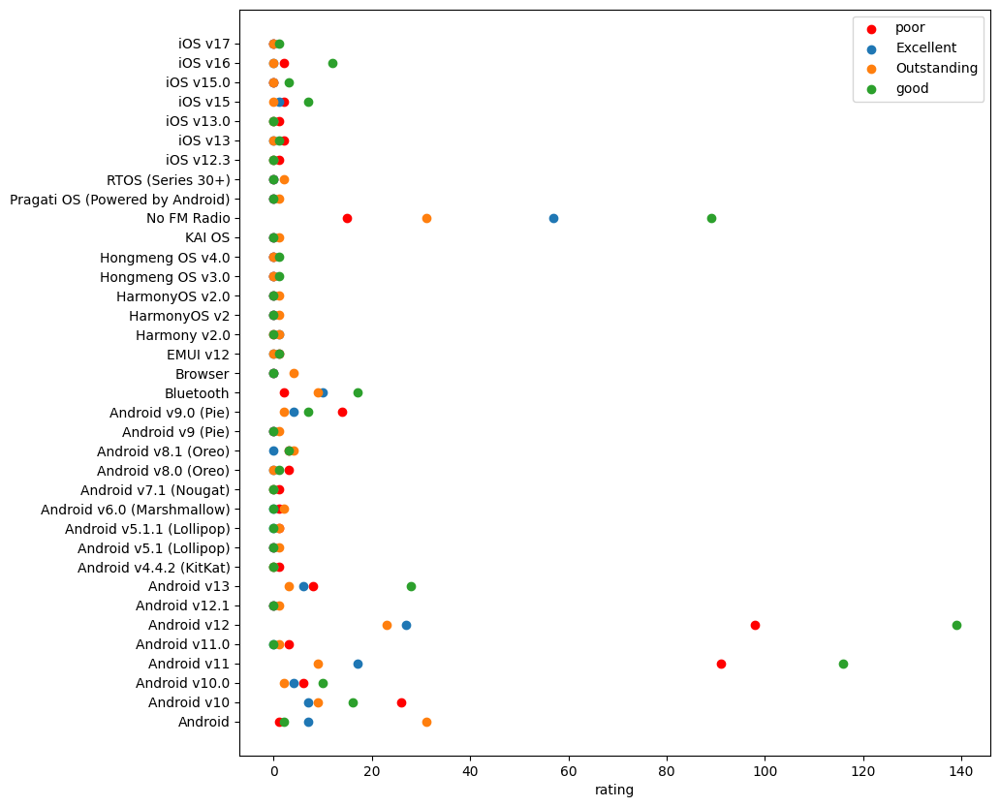

In [ ]:
d = pd.crosstab(df['os'],df['rating']).reset_index()
plt.figure(figsize=(10,10))
plt.scatter(x=d['poor'],y=d['os'],label = 'poor', color='red')
plt.scatter(x=d['Excellent'],y=d['os'],label = 'Excellent')
plt.scatter(x=d['Outstanding'],y=d['os'],label = 'Outstanding')
plt.scatter(x=d['good'],y=d['os'], label = 'good')
plt.legend()
plt.xlabel("rating")
plt.show()
#android is use by a lot of people - and equal probability
#honmang os - quite good rating wither good or outstanding , ios perofrm less than new versions of os and in the last old androids

In [ ]:
df['card'].value_counts()

,count
card,
"Memory Card Supported, upto 1 TB",171
Memory Card Not Supported,112
Android v12,107
"Memory Card Supported, upto 512 GB",105
"Memory Card (Hybrid), upto 1 TB",91
...,...
"Memory Card (Hybrid), upto 2 TB",1
HarmonyOS,1
"48 MP Quad Rear CameraMemory Card (Hybrid), upto 256 GB",1


In [ ]:
def convert(x):
  if "Memory Card Supported" in x:
    z = x.split("Memory Card Supported")
    z = list(set(z))
    k = re.findall("\d+",x)
    k = list(set(k))
    print(z,k)
    p =" ".join(z)
    print(p)
    return p;
  else:
    return x;


convert("Supportedupto 48 GBMemory Card Supportedupto 48 GBMemory Card Supportedupto 48 GBMemory Card Supportedupto 48 GBMemory Card Supportedupto 48 GBMemory Card Supported, upto 48 GBMemory Card Supported, upto 48 GBMemory Card Supported, upto 48 GBMemory Card Supported, upto 48 GBMemory Card Supported, upto 48 GBMemory Card Supported, upto 48 GBMemory Card Supported, upto 48 GBMemory Card Supported, upto 48 GBMemory Card Supported, upto 48 GBMemory Card Supported, upto 48 GBMemory Card Supported, upto 48 GBMemory Card Supported, upto 48 GBMemory Card Supported, upto 48 GBMemory Card Supported, upto 48 GBMemory Card Supported, upto 48 GBMemory Card Supported, upto 48 GBMemory Card Supportedupto 48 GBMemory Card Supportedupto 48 GBMemory Card Supportedupto 48 GBMemory Card Supportedupto 48 GBMemory Card Supportedupto 48 GBMemory Card Supportedupto 48 GBMemory Card Supportedupto 48 GBMemory Card Supportedupto 48 GBMemory Card Supportedupto 48 GBMemory Card Supportedupto 48 GBMemory Card Supportedupto 48 GBMemory Card Supportedupto 48 GBMemory Card Supportedupto 48 GBMemory Card Supportedupto 48 GBMemory Card Supportedupto 48 GBMemory Card Supportedupto 48 GBMemory Card Supported upto 48 GBMemory Card Supported upto 48 GBMemory Card Supportedupto 48 GBMemory Card Supportedupto 48 GBMemory Card Supportedupto 48 GBMemory Card Supportedupto 48 GBMemory Card Supportedupto 48 GBMemory Card Supportedupto 48 GBMemory Card Supportedupto 48 GBMemory Card Supportedupto 48 GBMemory Card Supportedupto 48 GBMemory Card Supportedupto 48 GBMemory Card Supportedupto 48 GBMemory Card Supportedupto 48 GBMemory Card Supportedupto 48 GBMemory Card Supportedupto 48 GBMemory Card Supportedupto 48 GBMemory Card Supportedupto 48 GBMemory Card Supported, upto 48 GBMemory Card Supported, upto 48 GBMemory Card Supported, upto 48 GBMemory Card Supported, upto 48 GBMemory Card Supported, upto 48 GBMemory Card Supported, upto 48 GBMemory Card Supported, upto 48 GBMemory Card Supported, upto 48 GBMemory Card Supported, upto 48 GBMemory Card Supported, upto 48 GBMemory Card Supported, upto 48 GBMemory Card Supported, upto 48 GBMemory Card Supported, upto 48 GBMemory Card Supported, upto 48 GBMemory Card Supported, upto 48 GBMemory Card Supported, upto 48 GBMemory Card Supportedupto 48 GBMemory Card Supportedupto 48 GBMemory Card Supportedupto 48 GBMemory Card Supportedupto 48 GBMemory Card Supportedupto 48 GBMemory Card Supportedupto 48 GBMemory Card Supportedupto 48 GBMemory Card Supportedupto 48 GBMemory Card Supportedupto 48 GBMemory Card Supportedupto 48 GBMemory Card Supportedupto 48 GBMemory Card Supportedupto 48 GBMemory Card Supportedupto 48 GBMemory Card Supportedupto 48 GBMemory Card Supportedupto 48 GBMemory Card Supportedupto 48 GBMemory Card Supported upto 48 GBMemory Card Supported upto 48 GBMemory Card Supportedupto 48 GBMemory Card Supportedupto 48 GBMemory Card")

[' upto 48\u2009GB', ', upto 48\u2009GB', 'upto 48\u2009GB', 'upto 48\u2009GBMemory Card', 'Supportedupto 48\u2009GB'] ['48']
 upto 48 GB , upto 48 GB upto 48 GB upto 48 GBMemory Card Supportedupto 48 GB


<>:5: SyntaxWarning: invalid escape sequence '\d'
<>:5: SyntaxWarning: invalid escape sequence '\d'
/tmp/ipykernel_3303/2124121708.py:5: SyntaxWarning: invalid escape sequence '\d'
  k = re.findall("\d+",x)


' upto 48\u2009GB , upto 48\u2009GB upto 48\u2009GB upto 48\u2009GBMemory Card Supportedupto 48\u2009GB'

In [ ]:
def new_fun2(x,i):
  # print(i)
  # print(x);
  x = str(x)
  i = int(i)
  # if 'Camera'in x:
  #   pp = str(df.loc[i,'camera'])
  #   df.loc[i,'camera'] = pp + x
  # if 'Androidv12'==x or x =='HarmonyOS' :
  #   pp = str(df.loc[i,'os'])
  #   df.loc[i,'os'] = pp + x
  # # z = x.split(",")
  # # print(set(z))
  # # z = list(set(z))
  # # z = "  ".join(z)
  # # z = list(dict.fromkeys(z))
  if 'Memory Card' in x:
    x = convert(x)
    return x;
  else :
    return 'Memory card not Supported'






dz = df['card'].reset_index().apply(lambda x: new_fun2(x['card'],x['index']),axis=1)
dz
dz.value_counts()

['', ', upto 1\u2009TB'] ['1']
 , upto 1 TB
['', ', upto 1\u2009TB'] ['1']
 , upto 1 TB
['', ', upto 1\u2009TB'] ['1']
 , upto 1 TB
[''] []

[''] []

['', ', upto 1\u2009TB'] ['1']
 , upto 1 TB
['', ', upto 1\u2009TB'] ['1']
 , upto 1 TB
[''] []

['', ', upto 1\u2009TB'] ['1']
 , upto 1 TB
['', ', upto 512\u2009GB'] ['512']
 , upto 512 GB
['', ', upto 1\u2009TB'] ['1']
 , upto 1 TB
['', ', upto 1\u2009TB'] ['1']
 , upto 1 TB
['', ', upto 1\u2009TB'] ['1']
 , upto 1 TB
['', ', upto 512\u2009GB'] ['512']
 , upto 512 GB
['', ', upto 1\u2009TB'] ['1']
 , upto 1 TB
[''] []

['', ', upto 1\u2009TB'] ['1']
 , upto 1 TB
['', ', upto 512\u2009GB'] ['512']
 , upto 512 GB
['', ', upto 1\u2009TB'] ['1']
 , upto 1 TB
['', ', upto 1\u2009TB'] ['1']
 , upto 1 TB
['', ', upto 1\u2009TB'] ['1']
 , upto 1 TB
['', ', upto 512\u2009GB'] ['512']
 , upto 512 GB
['', ', upto 1\u2009TB'] ['1']
 , upto 1 TB
['', ', upto 1\u2009TB'] ['1']
 , upto 1 TB
['', ', upto 1\u2009TB'] ['1']
 , upto 1 TB
['', ', upto 1\u

,count
Memory card not Supported,258
", upto 1 TB",171
Memory Card Not Supported,112
", upto 512 GB",105
"Memory Card (Hybrid), upto 1 TB",91
,89
", upto 256 GB",87
Memory Card (Hybrid),30
"Memory Card (Hybrid), upto 256 GB",13
"Memory Card (Hybrid), upto 512 GB",11


# #processor

In [ ]:
df['processor'].value_counts()

,count
processor,
"Dimensity 700 5G, Octa Core, 2.2 GHz Processor",29
"Helio P35, Octa Core, 2.3 GHz Processor",27
"Snapdragon 8+ Gen1, Octa Core, 3.2 GHz Processor",26
"Snapdragon 695, Octa Core, 2.2 GHz Processor",23
"Snapdragon 8 Gen2, Octa Core, 3.2 GHz Processor",23
...,...
"Snapdragon 710, Octa Core, 2.2 GHz Processor",1
"Exynos 7885, Octa Core, 2.2 GHz Processor",1
"Snapdragon 425, Quad Core, 1.2 GHz Processor",1


<Axes: xlabel='count', ylabel='processor'>

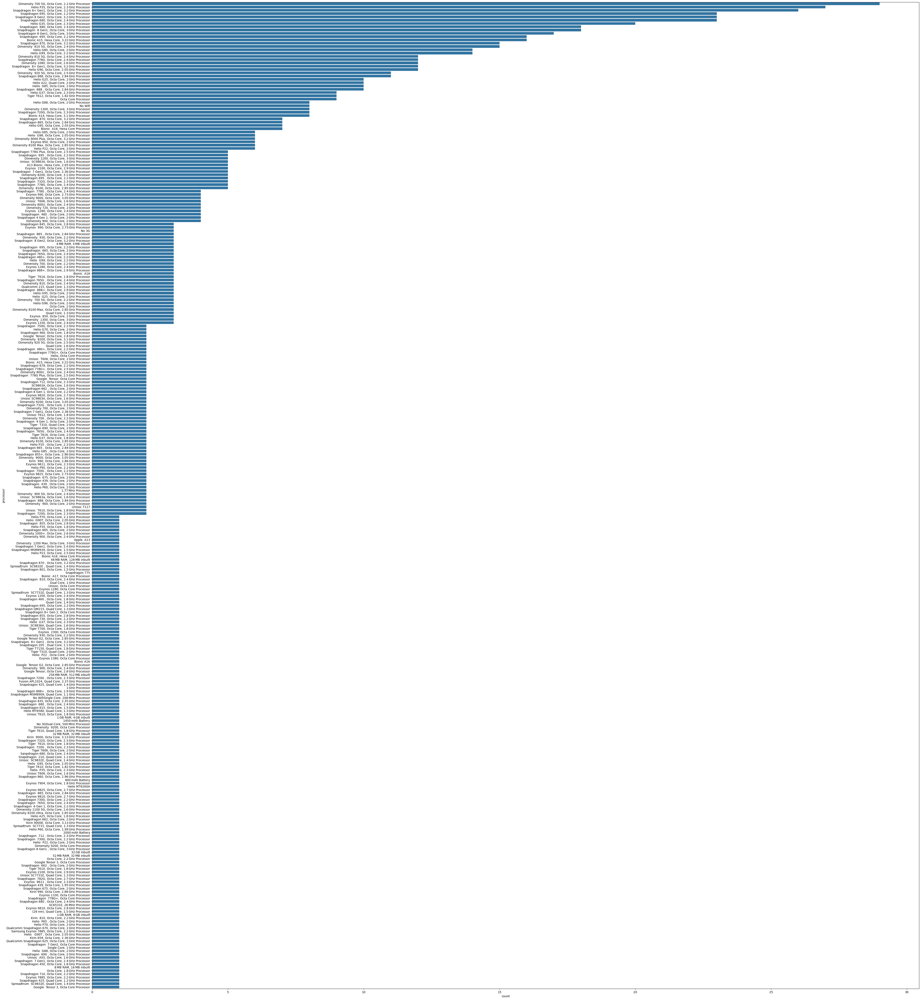

In [ ]:
t = df['processor'].value_counts().reset_index()
plt.figure(figsize=(50, 60))
sns.barplot(x='count',y='processor',data=t)


In [ ]:
a,b,c,d,e = [0,0,0,0,0]
def count(x):
  global a,b,c,d,e
  x = str(x)
  if 'Snapdragon' in x:
    a+=1
  elif 'Dimensity' in x:
    b+=1
  elif 'Helio' in x:
    c+=1
  elif 'Exynos' in x:
    d+=1
  elif 'Bionic' in x:
    e+=1
df['processor'].apply(lambda x:count(x))
print(a,b,c,d,e)

413 177 202 50 44


In [ ]:
def clear(x,i):
  x = str(x)
  i = int(i)
  if 'Processor' in x:
    return x
  elif 'RAM' in x:
    return total_function(x,i)
  elif 'No Wifi' in x:
    return 'Dimensity 700 5G, Octa Core, 2.2 GHz Processor'
  elif ' No 3G' in x:
    return "Helio P35, Octa Core, 2.3 GHz Processor"
df['processor'] = df['processor'].reset_index().apply(lambda x:clear(x['processor'],x['index']),axis=1)
df['processor']


,processor
0,"Snapdragon 8 Gen2, Octa Core, 3.2 GHz Processor"
1,"Snapdragon 695, Octa Core, 2.2 GHz Processor"
2,"Exynos 1330, Octa Core, 2.4 GHz Processor"
3,"Snapdragon 695, Octa Core, 2.2 GHz Processor"
4,"Dimensity 1080, Octa Core, 2.6 GHz Processor"
...,...
1015,"Snapdragon 8 Gen1, Octa Core, 3 GHz Processor"
1016,"Snapdragon 480+, Octa Core, 2.2 GHz Processor"
1017,"Dimensity 8100, Octa Core, 2.85 GHz Processor"
1018,"Snapdragon 695, Octa Core, 2.2 GHz Processor"


<Axes: xlabel='count', ylabel='processor'>

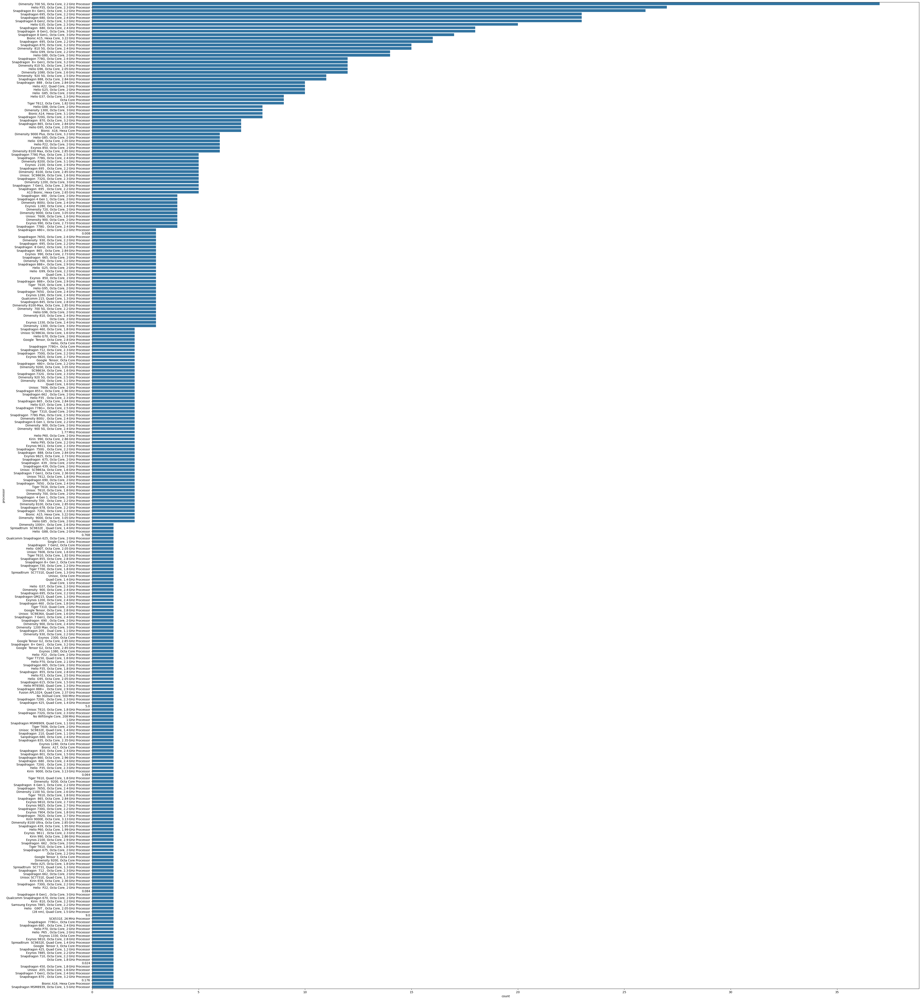

In [ ]:
t = df['processor'].value_counts().reset_index()
plt.figure(figsize=(50, 60))
sns.barplot(x='count',y='processor',data=t)


In [ ]:
def create_cat(x):
  x = str(x)
  if 'Snapdragon' in x:
    return 'Snapdragon'
  elif 'Dimensity' in x:
    return 'Dimensity'
  elif 'Helio' in x:
    return 'Helio'
  elif 'Exynos' in x:
    return 'Exynos'
  elif 'Bionic' in x:
    return 'Bionic'
  else:
    return 'other'

df['processor category'] =  df['processor'].reset_index().apply(lambda x:create_cat(x['processor']),axis=1)
df['processor category'].astype('category')

,processor category
0,Snapdragon
1,Snapdragon
2,Exynos
3,Snapdragon
4,Dimensity
...,...
1015,Snapdragon
1016,Snapdragon
1017,Dimensity
1018,Snapdragon


In [ ]:
df.groupby(by=['processor category','rating'])["price"].mean()
# .agg(func={
#     'price':'mean',
#     'price':'median',
#     'price':'min',
#     'price':'max',


# })
# jiski rating bht high h inn processors ke version m unme se best niche describe h almost excellent and outstandings one are good

processor category  rating     
Bionic              Excellent      179900.000000
                    Outstanding     43900.000000
                    good           114494.538462
                    poor            55154.416667
Dimensity           Excellent       41365.588235
                    Outstanding     18703.000000
                    good            23245.904348
                    poor            14856.576923
Exynos              Excellent       56454.666667
                    Outstanding     98496.750000
                    good            26010.529412
                    poor            14935.000000
Helio               Excellent       17999.000000
                    Outstanding      7637.583333
                    good            16530.754098
                    poor            10914.566929
Snapdragon          Excellent       59842.761364
                    Outstanding     75905.200000
                    good            25287.546667
                    poor            27851.295455
other               Excellent       53700.000000
                    Outstanding     16780.745763
                    good            53570.454545
                    poor            17409.783333
Name: price, dtype: float64

In [ ]:
df.head(10)
df[df['processor']=='No FM Radio']

,model,price,rating,sim,processor,battery,display,camera,card,os,total ram,processor category


#BATTERY

In [ ]:
df['battery'] = dt['battery']

In [ ]:
df['battery'].value_counts()

,count
battery,
5000 mAh Battery with 33W Fast Charging,103
5000 mAh Battery with 18W Fast Charging,89
5000 mAh Battery,74
5000 mAh Battery with 67W Fast Charging,30
5000 mAh Battery with 10W Fast Charging,28
...,...
5180 mAh Battery with 10W Fast Charging,1
4500 mAh Battery with 68W Fast Charging,1
8000 mAh Battery,1


<Axes: xlabel='count', ylabel='battery'>

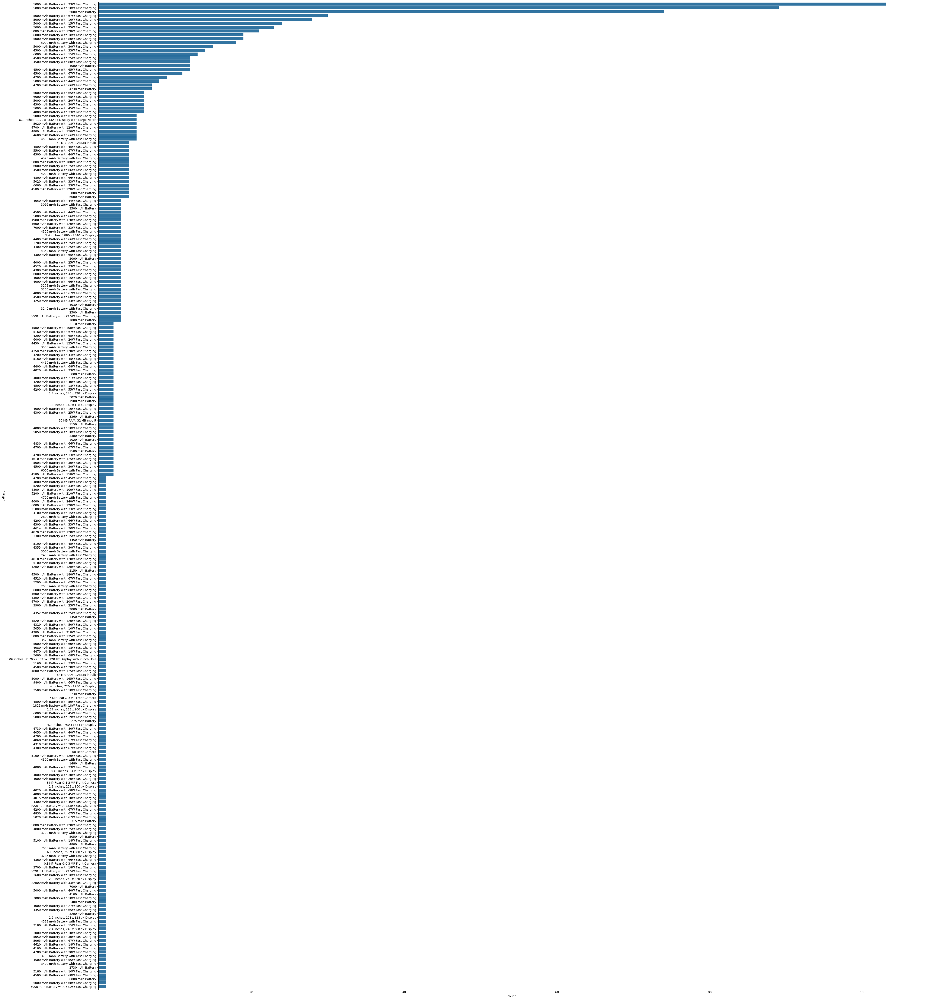

In [ ]:
t = df['battery'].value_counts().reset_index()
plt.figure(figsize=(50, 60))
sns.barplot(x='count',y='battery',data=t)

In [ ]:
x = "100 mAh Battery with 400 W"
re.findall('\d+',x)

<>:2: SyntaxWarning: invalid escape sequence '\d'
<>:2: SyntaxWarning: invalid escape sequence '\d'
/tmp/ipykernel_3303/1839749585.py:2: SyntaxWarning: invalid escape sequence '\d'
  re.findall('\d+',x)


['100', '400']

In [ ]:
df['charging (W)'] = 0
df['charging (W)'].value_counts()

,count
charging (W),
0,1020


In [ ]:
df['battery'] = dt['battery']
df['battery'].head(10)

,battery
0,5000 mAh Battery with 100W Fast Charging
1,5000 mAh Battery with 33W Fast Charging
2,5000 mAh Battery with 15W Fast Charging
3,5000 mAh Battery with Fast Charging
4,5000 mAh Battery with 67W Fast Charging
5,5000 mAh Battery with 25W Fast Charging
6,3279 mAh Battery with Fast Charging
7,4980 mAh Battery with 120W Fast Charging
8,4500 mAh Battery with 33W Fast Charging
9,4500 mAh Battery with 80W Fast Charging


In [ ]:
# x = "2.4 inches, 240 x 360 px Display1800 mAh Battery"
# k = re.search(r'.*Display',x)
# t = k.group()
df['battery'] = dt['battery']
def func(x,i):
  x = str(x)
  i = int(i)
  if 'RAM' in x:
    func_units(x)
    df.loc[i,'battery'] = 2000
  if 'Display' in x:
    k = re.search(r'.*Display',x)
    t = k.group()
    df.loc[i,'display'] = str(df.loc[i,'display']) + t
    df.loc[i,'battery'] = 2000
    return
  if 'Camera' in x:
    df.loc[i,'camera'] = str(df.loc[i,'camera']) + " "+ x
    df.loc[i,'battery'] = 2000

    return 0
  if 'Battery' in x:
    k = re.search(r'.*Battery',x)
    t = k.group()
    num = int(re.search(r'\d+',t).group())
    if 'Display' in x:
      print("num ",num, type(num))
    df.loc[i,'battery'] = num
  if 'Fast Charging'in x:
    # print(x)
    k = re.search(r"with.*",x)
    t = str(k.group())
    f = re.findall(r"\d+",t)

    t = 1
    if len(f)>0:
      t = int(f[0])
    df.loc[i,'charging (W)'] = t
    return


# df['battery'] =
df['battery'].reset_index().apply(lambda x:func(x['battery'],x['index']),axis=1)
df[df['battery'] =='6.1 inches, 1170 x 2532 px Display with Large Notch']
df['battery (mAh)'] = df['battery']
# df['battery'].value_counts()
# df['charging (W)'].value_counts()
# df.columns
# df.drop(columns=['battery','charging'])
# df['battery (mAh)'].value_counts()

<Axes: xlabel='price', ylabel='charging (W)'>

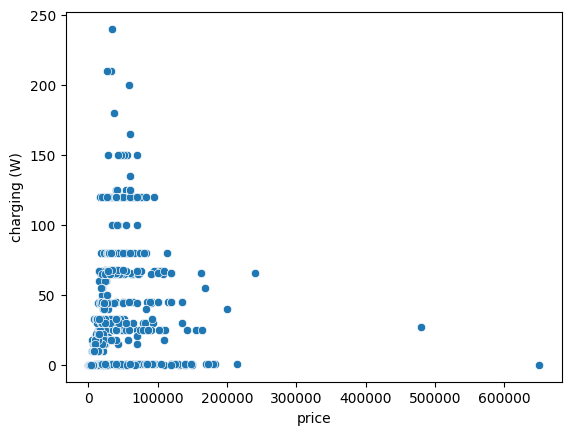

In [ ]:
sns.scatterplot(df,y='charging (W)',x='price')
#average rate is  below 10,000

<Axes: xlabel='price', ylabel='battery (mAh)'>

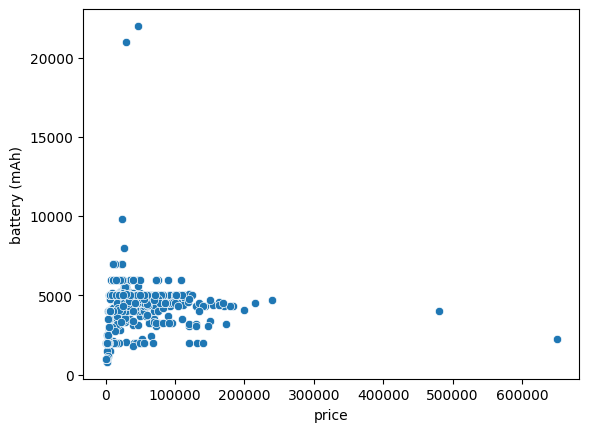

In [ ]:
sns.scatterplot(df,y='battery (mAh)',x='price')
# average price is 10,000 of mobile phones having battery 5000 mah

# DISPLAY

<Axes: ylabel='display'>

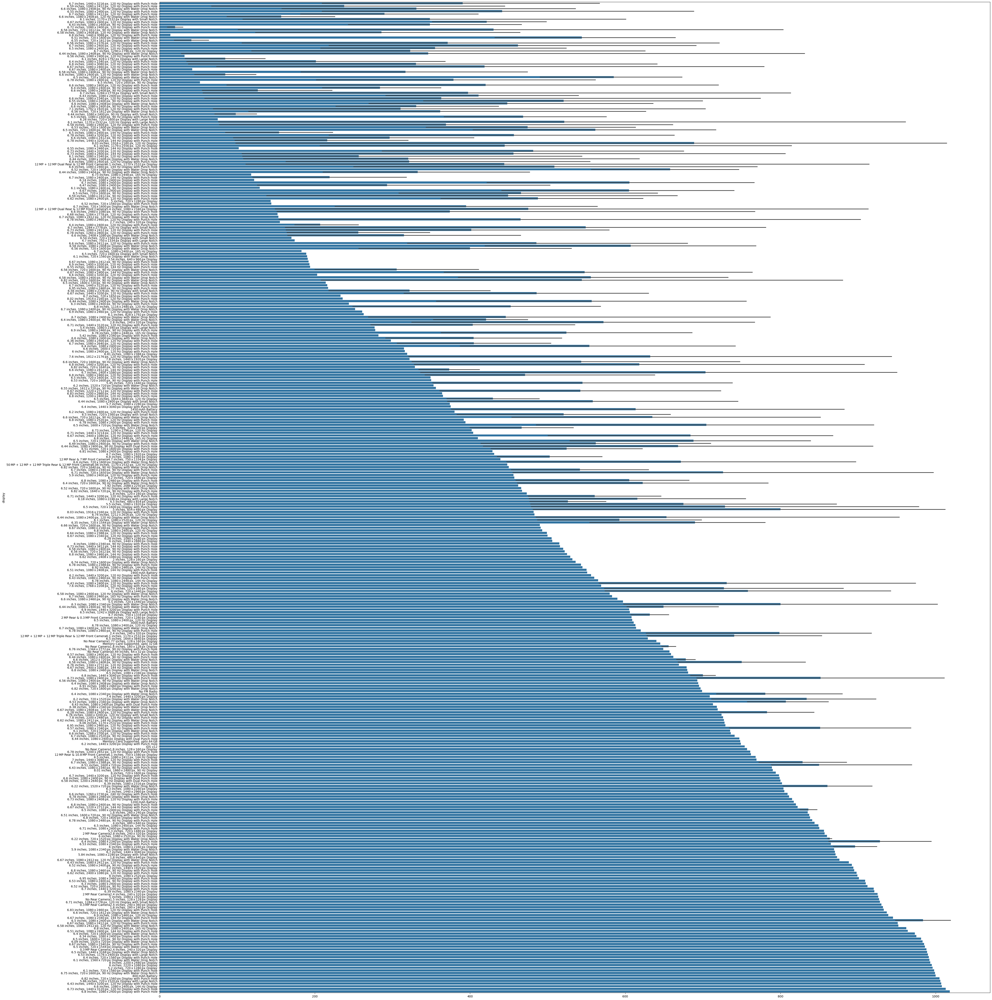

In [ ]:
plt.figure(figsize=(50, 60))
sns.barplot(df['display'])

In [ ]:
df['display'].value_counts().reset_index()

,display,count
0,"6.67 inches, 1080 x 2400 px, 120 Hz Display wi...",54
1,"6.5 inches, 720 x 1600 px Display with Water D...",36
2,"6.7 inches, 1080 x 2412 px, 120 Hz Display wit...",25
3,"6.52 inches, 720 x 1600 px Display with Water ...",23
4,"6.5 inches, 1080 x 2400 px, 90 Hz Display with...",22
...,...,...
371,"5.86 inches, 720 x 1520 px Display with Large ...",1
372,"6.43 inches, 1440 x 3200 px, 120 Hz Display wi...",1
373,"6.6 inches, 1080 x 2400 px, 144 Hz Display",1
374,"6.73 inches, 1440 x 3120 px, 120 Hz Display wi...",1


In [ ]:
df['display size'] = 'small'
df['display resolution'] = "Low"
import re

def categorize_display(x,i):

    x = str(x)
    i = int(i)
    x = x.replace('\u2009', ' ')
    inch = re.search(r'\d+\.?\d*(?=\s*inches)', x)
    if not inch:
      if 'Camera' in x:
        df.loc[i,'camera'] = str(df.loc[i,'camera']) + " "+ x
        df.loc[i,'display size '] = 'small'
        df.loc[i,'display resolution'] = 'Low'
        return
      if 'Battery' in x:
        func(x,i)

        df.loc[i,'display size '] = 'small'
        df.loc[i,'display resolution'] = 'Low'
        return
      if 'Card' in x:
        df.loc[i,'card'] = convert(x)
        df.loc[i,'display size '] = 'small'
        df.loc[i,'display resolution'] = 'Low'
        return
      else:
        df.loc[i,'display size '] = 'small'
        df.loc[i,'display resolution'] = 'Low'
        return
      print(x)
    inch = float(inch.group())
    resolution = re.search(r'(\d+)\s*x\s*(\d+)', x)
    width = int(resolution.group(1))
    height = int(resolution.group(2))
    if 'Camera' in x:
      df.loc[i,'camera'] = str(df.loc[i,'camera']) + " "+ x
      df.loc[i,'display size '] = 'small'
      df.loc[i,'display resolution'] = 'Low'
      return

    # size category
    size = " small"
    if inch < 5.5:
        size = 'Small'

    elif inch <= 6.4:
        size = 'Medium'

    else:
        size = 'Large'
    df.loc[i,'display size'] = size

    # resolution category
    quality = 'Low'
    if width < 720:
        quality = 'Low'

    elif width < 1080:
        quality = 'HD'

    elif width < 1440:
        quality = 'Full HD'

    else:
        quality = '2K'
    df.loc[i,'display resolution'] = quality
    # print(size,quality)
    # return size + quality



df['display'].reset_index().apply(lambda x: categorize_display(x['display'],x['index']),axis =1)

['', ', upto 32 GB'] ['32']
 , upto 32 GB
['', ', upto 64 GB'] ['64']
 , upto 64 GB


,0
0,None
1,None
2,None
3,None
4,None
...,...
1015,None
1016,None
1017,None
1018,None


In [ ]:
df['display'] = dt['display']
df['display'].reset_index()

,index,display
0,0,"6.7 inches, 1440 x 3216 px, 120 Hz Display wit..."
1,1,"6.59 inches, 1080 x 2412 px, 120 Hz Display wi..."
2,2,"6.6 inches, 1080 x 2408 px, 90 Hz Display with..."
3,3,"6.55 inches, 1080 x 2400 px, 120 Hz Display wi..."
4,4,"6.7 inches, 1080 x 2412 px, 120 Hz Display wit..."
...,...,...
1015,1015,"6.67 inches, 1080 x 2460 px, 120 Hz Display wi..."
1016,1016,"6.5 inches, 720 x 1600 px Display with Water D..."
1017,1017,"6.6 inches, 1080 x 2460 px, 144 Hz Display wit..."
1018,1018,"6.8 inches, 1080 x 2400 px Display with Punch ..."


In [ ]:
df['display size'].reset_index()

,index,display size
0,0,Large
1,1,Large
2,2,Large
3,3,Large
4,4,Large
...,...,...
1015,1015,Large
1016,1016,Large
1017,1017,Large
1018,1018,Large


In [ ]:
df['display resolution'].value_counts()

,count
display resolution,
Full HD,636
HD,215
2K,115
Low,54


In [ ]:
df.drop(columns=['display'],inplace = True)

<Axes: xlabel='price', ylabel='display size'>

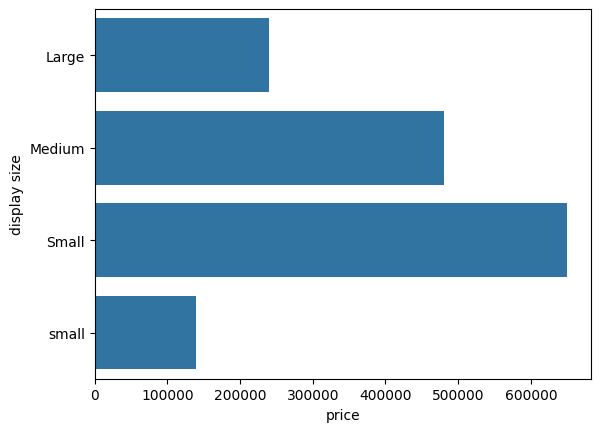

In [ ]:
t = df.groupby(by='display size')['price'].max().reset_index()
sns.barplot(t,y='display size',x='price')

<Axes: xlabel='price', ylabel='display resolution'>

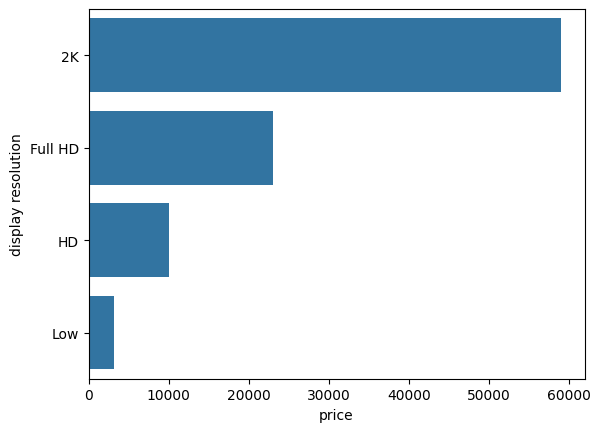

In [ ]:
t = df.groupby(by='display resolution')['price'].median().reset_index()
sns.barplot(t,y='display resolution',x = 'price')

In [ ]:
df.drop(columns ='display size ')

,model,price,rating,sim,processor,battery,camera,card,os,total ram,processor category,charging (W),battery (mAh),display size,display resolution
0,OnePlus 11 5G,54999,Excellent,5.0,"Snapdragon 8 Gen2, Octa Core, 3.2 GHz Processor",5000,50 MP + 48 MP + 32 MP Triple Rear & 16 MP Fron...,Memory Card Not Supported,Android v13,268.0,Snapdragon,100,5000,Large,2K
1,OnePlus Nord CE 2 Lite 5G,19989,good,4.0,"Snapdragon 695, Octa Core, 2.2 GHz Processor",5000,64 MP + 2 MP + 2 MP Triple Rear & 16 MP Front ...,"Memory Card (Hybrid), upto 1 TB",Android v12,134.0,Snapdragon,33,5000,Large,Full HD
2,Samsung Galaxy A14 5G,16499,poor,4.0,"Exynos 1330, Octa Core, 2.4 GHz Processor",5000,50 MP + 2 MP + 2 MP Triple Rear & 13 MP Front ...,"Memory Card Supported, upto 1 TB",Android v13,68.0,Exynos,15,5000,Large,Full HD
3,Motorola Moto G62 5G,14999,good,4.0,"Snapdragon 695, Octa Core, 2.2 GHz Processor",5000,50 MP + 8 MP + 2 MP Triple Rear & 16 MP Front ...,"Memory Card (Hybrid), upto 1 TB",Android v12,134.0,Snapdragon,1,5000,Large,Full HD
4,Realme 10 Pro Plus,24999,good,4.0,"Dimensity 1080, Octa Core, 2.6 GHz Processor",5000,108 MP + 8 MP + 2 MP Triple Rear & 16 MP Front...,Memory Card Not Supported,Android v13,134.0,Dimensity,67,5000,Large,Full HD
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1015,Motorola Moto Edge S30 Pro,34990,good,4.0,"Snapdragon 8 Gen1, Octa Core, 3 GHz Processor",5000,64 MP + 8 MP + 2 MP Triple Rear & 16 MP Front ...,Android v12,No FM Radio,136.0,Snapdragon,68,5000,Large,Full HD
1016,Honor X8 5G,14990,poor,4.0,"Snapdragon 480+, Octa Core, 2.2 GHz Processor",5000,48 MP + 2 MP + Depth Sensor Triple Rear & 8 MP...,"Memory Card Supported, upto 1 TB",Android v11,134.0,Snapdragon,22,5000,Large,HD
1017,POCO X4 GT 5G (8GB RAM + 256GB),28990,good,15.0,"Dimensity 8100, Octa Core, 2.85 GHz Processor",5080,64 MP + 8 MP + 2 MP Triple Rear & 16 MP Front ...,Memory Card Not Supported,Android v12,264.0,Dimensity,67,5080,Large,Full HD
1018,Motorola Moto G91 5G,19990,good,5.0,"Snapdragon 695, Octa Core, 2.2 GHz Processor",5000,108 MP + 8 MP + 2 MP Triple Rear & 32 MP Front...,"Memory Card Supported, upto 1 TB",Android v12,134.0,Snapdragon,1,5000,Large,Full HD


In [ ]:
k = df['camera'].value_counts().reset_index()

<Axes: ylabel='camera'>

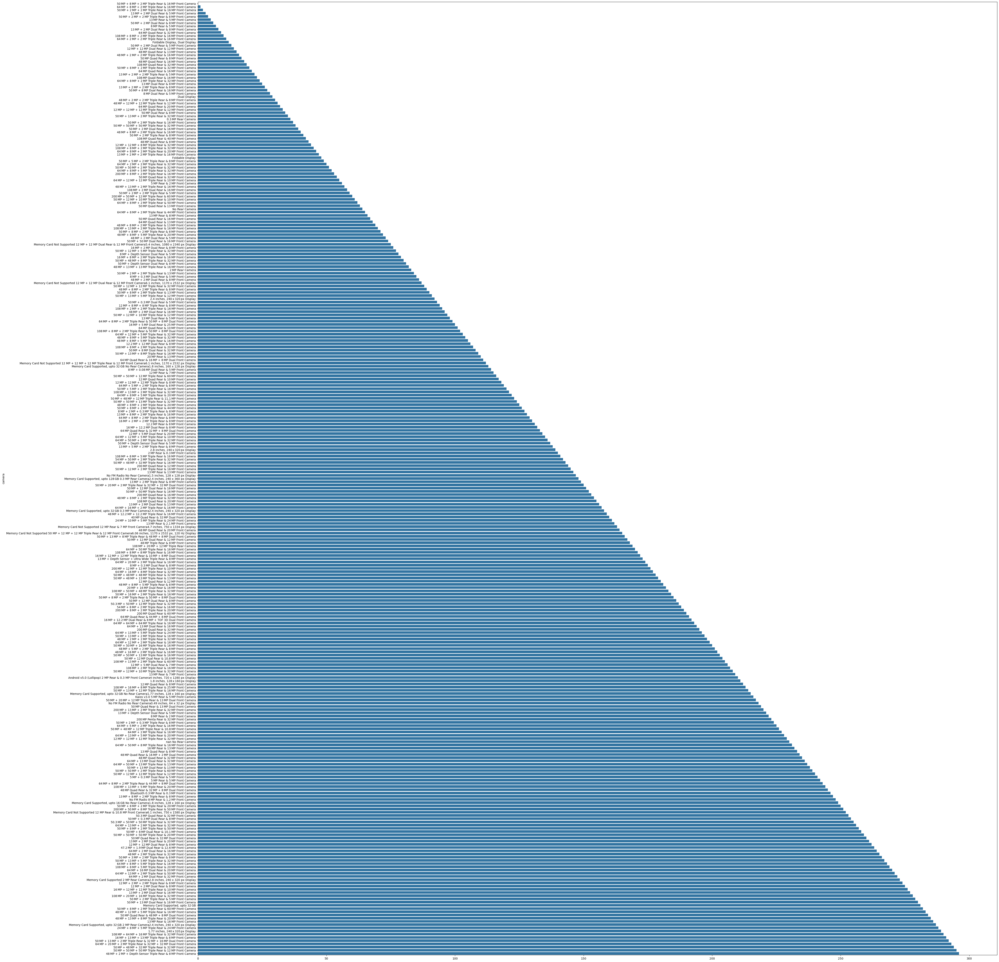

In [ ]:
plt.figure(figsize=(50, 60))
sns.barplot(k['camera'])

In [ ]:
import re

def extract_rear(x):
    x = str(x)
    if 'Rear' in x:
        k = re.search(r"\d+", x)
        return int(k.group()) if k else 0
    return 0

def extract_front(x):
    x = str(x)

    k = re.search(r"(\d+)\s*MP Front Camera", x)

    return int(k.group(1)) if k else 0


df['primary rear camera'] = df['camera'].apply(extract_rear)
df['primary front camera'] = df['camera'].apply(extract_front)

In [ ]:
df['primary rear camera'].value_counts()
df.drop(columns="display size ",inplace=True)

In [ ]:
df

,model,price,rating,sim,processor,battery,card,os,total ram,processor category,charging (W),battery (mAh),display size,display resolution,primary rear camera,primary front camera,primary front camera
0,OnePlus 11 5G,54999,Excellent,5.0,"Snapdragon 8 Gen2, Octa Core, 3.2 GHz Processor",5000,Memory Card Not Supported,Android v13,268.0,Snapdragon,100,5000,Large,2K,50,12,16
1,OnePlus Nord CE 2 Lite 5G,19989,good,4.0,"Snapdragon 695, Octa Core, 2.2 GHz Processor",5000,"Memory Card (Hybrid), upto 1 TB",Android v12,134.0,Snapdragon,33,5000,Large,Full HD,64,12,16
2,Samsung Galaxy A14 5G,16499,poor,4.0,"Exynos 1330, Octa Core, 2.4 GHz Processor",5000,"Memory Card Supported, upto 1 TB",Android v13,68.0,Exynos,15,5000,Large,Full HD,50,12,13
3,Motorola Moto G62 5G,14999,good,4.0,"Snapdragon 695, Octa Core, 2.2 GHz Processor",5000,"Memory Card (Hybrid), upto 1 TB",Android v12,134.0,Snapdragon,1,5000,Large,Full HD,50,12,16
4,Realme 10 Pro Plus,24999,good,4.0,"Dimensity 1080, Octa Core, 2.6 GHz Processor",5000,Memory Card Not Supported,Android v13,134.0,Dimensity,67,5000,Large,Full HD,108,12,16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1015,Motorola Moto Edge S30 Pro,34990,good,4.0,"Snapdragon 8 Gen1, Octa Core, 3 GHz Processor",5000,Android v12,No FM Radio,136.0,Snapdragon,68,5000,Large,Full HD,64,12,16
1016,Honor X8 5G,14990,poor,4.0,"Snapdragon 480+, Octa Core, 2.2 GHz Processor",5000,"Memory Card Supported, upto 1 TB",Android v11,134.0,Snapdragon,22,5000,Large,HD,48,12,8
1017,POCO X4 GT 5G (8GB RAM + 256GB),28990,good,15.0,"Dimensity 8100, Octa Core, 2.85 GHz Processor",5080,Memory Card Not Supported,Android v12,264.0,Dimensity,67,5080,Large,Full HD,64,12,16
1018,Motorola Moto G91 5G,19990,good,5.0,"Snapdragon 695, Octa Core, 2.2 GHz Processor",5000,"Memory Card Supported, upto 1 TB",Android v12,134.0,Snapdragon,1,5000,Large,Full HD,108,12,32


# CARD

In [ ]:
df['card'].value_counts()

,count
card,
"Memory Card Supported, upto 1 TB",171
Memory Card Not Supported,112
Android v12,107
"Memory Card Supported, upto 512 GB",105
"Memory Card (Hybrid), upto 1 TB",91
...,...
"Memory Card (Hybrid), upto 2 TB",1
HarmonyOS,1
"48 MP Quad Rear CameraMemory Card (Hybrid), upto 256 GB",1


<Axes: ylabel='card'>

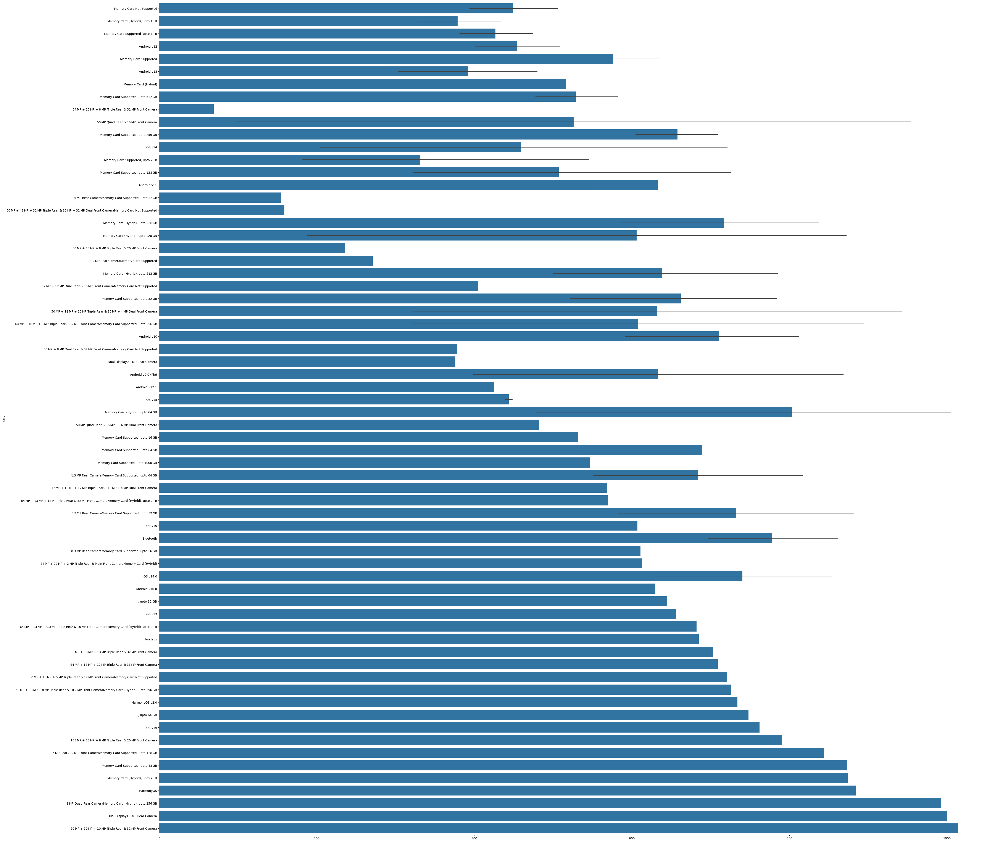

In [ ]:
plt.figure(figsize=(50,50))
sns.barplot(df['card'])

In [ ]:
def fun_card_support(x):
  x = str(x)

  if 'Memory Card Supported' in x:
    return 1
  else :
    return 0

def fun_card_num(x):
  x = str(x)
  if 'Memory Card Supported' in x:
    if 'upto' in x:
        k = re.search(r'upto\s*(.*)', x).group()
        k = re.findall("\d+",k)
        if not k :
          return 0
        # print(k)
        k = (int)(k[0]) if len(k)>0 else 0
        if 'GB' in x:
          # print("a")
          return k;
        elif 'TB' in x:
          # print("b")
          return 1024*k;
        else:
          # print("c")
          return 0.001*k;
    else:
      return 1;
  else:
    return 0;
df['memory support'] = df['card'].apply(lambda x:fun_card_support(x))
df['memory limit'] = df['card'].apply(lambda x:fun_card_num(x))
# df['memory support'].value_counts()





<>:14: SyntaxWarning: invalid escape sequence '\d'
<>:14: SyntaxWarning: invalid escape sequence '\d'
/tmp/ipykernel_3303/2634656062.py:14: SyntaxWarning: invalid escape sequence '\d'
  k = re.findall("\d+",k)


In [ ]:
df['memory support']

,memory support
0,0
1,0
2,1
3,0
4,0
...,...
1015,0
1016,1
1017,0
1018,1


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1020 entries, 0 to 1019
Data columns (total 18 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   model                  1020 non-null   object 
 1   price                  1020 non-null   int64  
 2   rating                 1020 non-null   object 
 3   sim                    1020 non-null   float64
 4   processor              1004 non-null   object 
 5   battery                1020 non-null   object 
 6   os                     1020 non-null   object 
 7   total ram              1020 non-null   float64
 8   processor category     1020 non-null   object 
 9   charging (W)           1020 non-null   int64  
 10  battery (mAh)          1020 non-null   object 
 11  display size           1020 non-null   object 
 12  display resolution     1020 non-null   object 
 13  primary rear camera    1020 non-null   int64  
 14  primary front camera   1020 non-null   int64  
 15  prim

In [ ]:
df.to_csv("smartphones-cleaned by me",index= False)